In [1]:
from bertopic import BERTopic
import pandas as pd
from umap import UMAP
from sentence_transformers import SentenceTransformer

In [2]:
data = pd.read_csv("C:/Users/nomen/Twitter_Data_Analysis/data/twitter_cleaned.csv", encoding='utf-8')
docs = data.Text.tolist()
timestamps = data.CreatedAt.to_list()

In [3]:
docs[210]

'Details on the differences between OpenAI API models. Latest available models are GPT3.5 - see'

In [4]:
# load the model
try:
    pretrained_model = SentenceTransformer('all-mpnet-base-v2')
    print("Model loaded successfully.")
except Exception as e:
    print(f"An error occurred: {e}")


Model loaded successfully.


In [5]:
# set seed
umap_seed = UMAP(random_state=42)

# MPNET Sentence-BERT Model
topic_model = BERTopic(embedding_model= pretrained_model ,
                       umap_model=umap_seed, verbose=True)

In [6]:
# take all the docs and embed and predict. Prediction about where they are going to be clustered
# runtime: ca. 60 min
topics, probs = topic_model.fit_transform(docs)

2024-01-24 10:15:56,728 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/1092 [00:00<?, ?it/s]

2024-01-24 11:01:40,691 - BERTopic - Embedding - Completed ✓
2024-01-24 11:01:40,691 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-01-24 11:02:34,733 - BERTopic - Dimensionality - Completed ✓
2024-01-24 11:02:34,734 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-01-24 11:02:37,731 - BERTopic - Cluster - Completed ✓
2024-01-24 11:02:37,762 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-01-24 11:02:39,906 - BERTopic - Representation - Completed ✓


In [7]:
# Summary table
topic_info_df = topic_model.get_topic_info()
topic_info_df

,Topic,Count,Name,Representation,Representative_Docs
0,-1,15709,-1_it_to_gpt_and,"[it, to, gpt, and, is, the, chatgpt, of, for, in]",[This means that ChatGPT is really good at und...
1,0,1547,0_openai_api_microsoft_playground,"[openai, api, microsoft, playground, chatgpt, ...",[get an openai account & learn to use the GPT-...
2,1,1164,1_ai_will_we_future,"[ai, will, we, future, jobs, world, be, the, a...",[While AI tools like GPT-3 can be very powerfu...
3,2,537,2_students_essay_essays_student,"[students, essay, essays, student, teachers, c...",[In college they had us review other students ...
4,3,419,3_argues_discusses_post_concept,"[argues, discusses, post, concept, author, sug...","[GPT-3] This post discusses the concept of ""sa..."
...,...,...,...,...,...
383,382,10,382_slm_unpopular_precision_sibling,"[slm, unpopular, precision, sibling, manifesta...",[Is the large language model ChatGPT that is p...
384,383,10,383_yooo_idc_sick_did,"[yooo, idc, sick, did, basis, regular, straigh...","[Did you use GPT-3 to make them? If not IDC, T..."
385,384,10,384_bots_literal_pleasant_malone,"[bots, literal, pleasant, malone, aborted, sum...",[Russian trolls spent over a million dollars a...
386,385,10,385_cpa_quizicist_aicpa_blueprints,"[cpa, quizicist, aicpa, blueprints, pinky, uni...",[Quizicist uses GPT-3 to analyze the text and ...


In [8]:
# save_topic model as csv
topic_model.save("C:/Users/nomen/Twitter_Data_Analysis/Topic_modeling/topic_model", serialization="safetensors", save_ctfidf=True, save_embedding_model="all-mpnet-base-v2")

In [8]:
topic_model.get_topic(171)

[('reinforcement', 0.0131231232319943),
 ('chief', 0.012581018771015041),
 ('labelers', 0.012421721373738714),
 ('scientist', 0.011322334539703209),
 ('belief', 0.010874569174783447),
 ('sources', 0.009959156556813023),
 ('40', 0.009725515243793127),
 ('rochko', 0.009647196371935),
 ('59', 0.009647196371935),
 ('eugen', 0.009647196371935)]

In [9]:
topic_model.get_representative_docs(15)

['Legal Tech Startup Lexion Tasks GPT-3 to Help Draft Contracts in Microsoft Word',
 'Legal Tech Startup Lexion Tasks GPT-3 to Help Draft Contracts in',
 'Researchers tested GPT-3.5 with questions from the US Bar Exam. They predict that GPT-4 might be able to pass the exam very soon. By passing the Bar exam, lawyers are admitted to the bar of a U.S. state']

In [10]:
df = pd.DataFrame({"topic": topics, "document": docs})
df

,topic,document
0,81,GPT-3] This article is a weekly summary of the...
1,-1,GPT-3-generated Frasier scene where Niles come...
2,-1,I just asked GPT-3 to write an affidavit for m...
3,-1,It is good form to state at the end of the aff...
4,21,"Out of the way, you pitiable meatbags: ""OpenAI..."
...,...,...
34931,21,Bard: “a tribal poet-singer skilled in composi...
34932,48,Google Bard A.I. announced in response to ChatGPT
34933,48,The game is getting even more interesting! Goo...
34934,-1,Do you manually paste all the answers to the q...


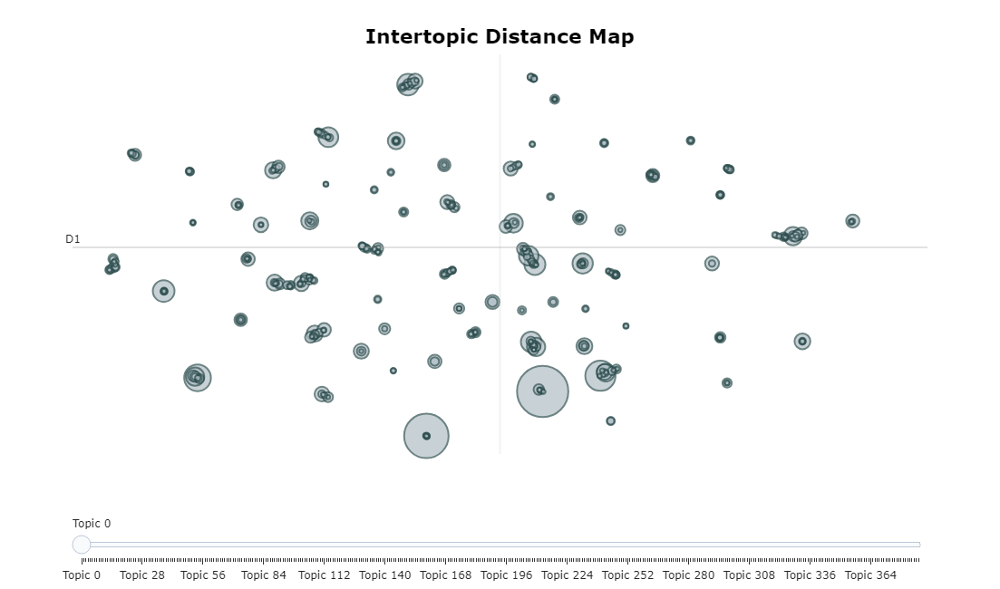

In [10]:
topic_model.visualize_topics()

In [12]:
hierarchical_topics = topic_model.hierarchical_topics(docs)
hierarchical_topics

100%|██████████| 386/386 [00:04<00:00, 94.71it/s] 


,Parent_ID,Parent_Name,Topics,Child_Left_ID,Child_Left_Name,Child_Right_ID,Child_Right_Name,Distance
385,772,openai_the_gpt_to_of,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",751,language_natural_chatbot_developed_processing,771,the_gpt_to_ai_of,2.341052
384,771,the_gpt_to_ai_of,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",768,openai_parameters_chatgpt_api_is,770,ai_this_post_discusses_the,2.081342
383,770,ai_this_post_discusses_the,"[2, 3, 4, 8, 11, 12, 15, 16, 19, 20, 21, 22, 2...",759,search_google_bing_engine_seo,769,ai_this_discusses_toshi_post,1.751224
382,769,ai_this_discusses_toshi_post,"[2, 3, 4, 8, 12, 15, 19, 20, 21, 22, 24, 25, 2...",763,writing_tweets_write_tweet_twitter,767,toshi_discusses_argues_post_article,1.684277
381,768,openai_parameters_chatgpt_api_is,"[0, 1, 5, 6, 7, 9, 10, 13, 14, 17, 18, 23, 26,...",766,parameters_billion_175_trillion_llms,764,openai_api_chatgpt_ai_is,1.667001
...,...,...,...,...,...,...,...,...
4,391,mental_health_therapy_support_koko,"[30, 72]",30,mental_health_support_therapy_therapist,72,mental_health_koko_therapy_support,0.351795
3,390,november_family_supervised_launched_reinforcement,"[109, 349]",349,supervised_reinforcement_family_november_techn...,109,november_family_transformer_launched_pre,0.323431
2,389,search_google_engine_information_engines,"[11, 16]",16,search_google_engine_chatgpt_engines,11,search_google_engine_information_feedback,0.301558
1,388,azure_service_codex_dall_availability,"[49, 262]",262,azure_customers_inference_service_infrastructure,49,azure_service_codex_dall_availability,0.272733


In [15]:
# save hierarchical_topics as csv
hierarchical_topics.to_csv("C:/Users/nomen/Twitter_Data_Analysis/Topic_modeling/hierarchical_topics.csv", index=False)

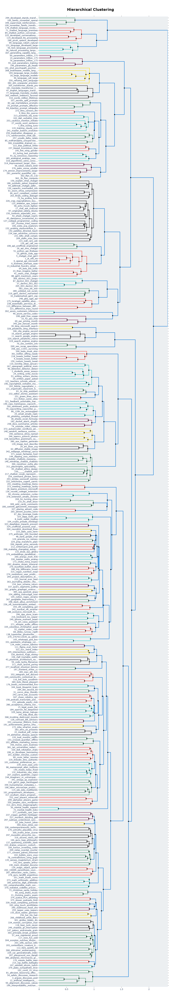

In [12]:
hierarchical_vis = topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)
hierarchical_vis

In [15]:
print(topic_model.get_representative_docs(283))
print('\n')
print(topic_model.get_representative_docs(22))
print('\n')
print(topic_model.get_representative_docs(34))


['This Artificial Intelligence (AI) Study From the UK Presents A GPT-3 Like Language Model That Can Simulate A Patient’s Health Predictions Using EHRs', 'This Artificial Intelligence (AI) Study From the UK Presents A GPT-3 Like Language Model That Can Simulate A Patient’s Health Predictions Using EHRs - MarkTechPost: This Artificial Intelligence (AI) Study From the UK Presents A GPT-3 Like Language Model', 'This Artificial Intelligence (AI) Study From the UK Presents A GPT-3 Like Language Model That Can Simulate A Patient’s Health Predictions Using EHRs - MarkTechPost: This Artificial Intelligence (AI) Study From the']


["I'm about to release a free web app for medical diagnosis assistance with 3.5 based on a patient's characteristics, close context, symptoms, observations, and on-going treatment(s). Stay tuned! (BTW: an access to would help me a lot", 'People should not use GPT-3 for medical diagnosis', 'Already taking GPT-3’s medical advice over my doctor’s']


["might one day be ab

In [46]:
tree = topic_model.get_topic_tree(hierarchical_topics)
print(tree)

.
├─language_natural_chatbot_developed_processing
│    ├─family_november_supervised_launched_reinforcement
│    │    ├─■──developed_stands_transformer_generative_chatbot ── Topic: 294
│    │    └─family_november_supervised_launched_reinforcement
│    │         ├─■──family_november_openai_language_chatbot ── Topic: 100
│    │         └─november_family_supervised_launched_reinforcement
│    │              ├─■──supervised_reinforcement_family_november_techniques ── Topic: 349
│    │              └─■──november_family_transformer_launched_pre ── Topic: 109
│    └─language_natural_processing_developed_text
│         ├─chatbot_language_developed_model_conversational
│         │    ├─chatbot_language_conversations_python_model
│         │    │    ├─■──chatbot_language_revolutionary_function_utilizing ── Topic: 178
│         │    │    └─chatbot_python_conversations_language_conversational
│         │    │         ├─■──chatbot_language_premises_botkit_openai ── Topic: 71
│         │    │        

In [11]:
# Analyzing the evolution of topics over time: Dynamic Topic Modeling.
topics_over_time = topic_model.topics_over_time(docs, timestamps, datetime_format="%Y-%m-%d %H:%M:%S", nr_bins=20)


20it [00:17,  1.15it/s]


In [12]:
# Tuning
topics_over_time = topic_model.topics_over_time(docs, timestamps, 
                                                global_tuning=True, evolution_tuning=True, nr_bins=20)


20it [00:16,  1.19it/s]


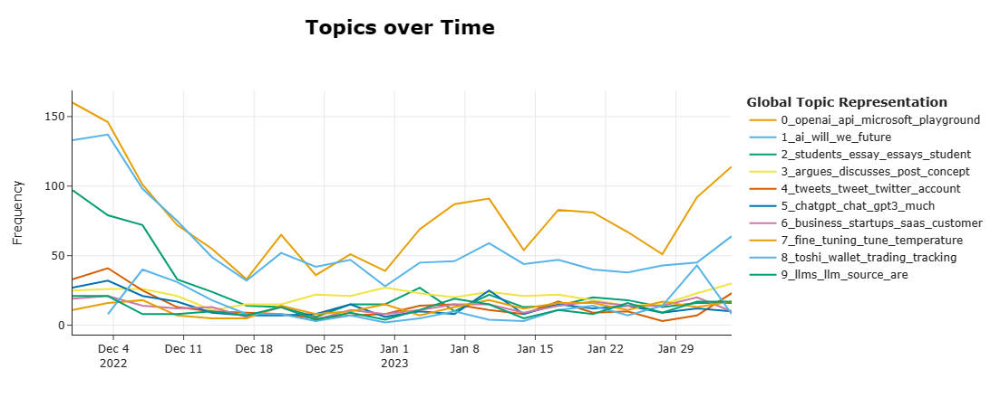

In [13]:
# Visualization without any grouping/ categorizing
topic_model.visualize_topics_over_time(topics_over_time, top_n_topics=10)


In [14]:
ability = [ 305, 181, 47, 77, 365, 310, 357, 82, 35, 94, 63, 91, 185, 318, 51, 10, 5, 1, 0, 6, 13, 110, 167, 40, 2, 24, 53, 29, 321,
           149, 160, 79, 86, 25, 83, 372, 148, 340, 246, 228, 380, 139, 20, 62, 342, 270, 288, 315, 274, 154, 337, 335, 280, 15, 184,
           329, 343, 368, 191, 172, 283, 22, 34, 101, 239, 98, 145, 132, 267, 244, 30, 72, 338, 179, 300, 247, 316, 73, 80, 21 ]

ads= [ 262, 49, 121, 93, 232, 371, 144, 42, 146, 366, 311, 95, 230, 217, 254, 293, 332, 136, 90, 378, 67, 325, 8, 104, 364, 225, 261,
      385, 52, 68, 138, 279, 165, 331, 336, 43, 59, 211, 277, 197, 285, 352, 164, 116, 384, 346, 16, 11, 220, 319, 38, 182, 258, 74 ]

develop = [ 39, 328, 291, 373, 28, 275, 48, 236, 355, 242, 19, 271, 322, 245, 326, 252, 299, 350, 312 ]

comparative = [ 60, 14, 76, 55, 190, 141, 308, 194, 18, 46, 250, 382, 314, 96, 276, 174, 281, 64, 23, 41, 88, 369, 87, 37, 205, 383,
               289, 219, 32, 248, 175, 238, 113, 221 ]

allgemein = [ 294, 100, 349, 109, 178, 71, 84, 333, 114, 286, 99, 131, 56, 36, 307, 208, 33, 69, 345, 120, 153, 103, 356 ]

impacts = [ 70, 269, 358, 122, 196, 292, 341, 214, 359, 168, 115, 161, 317 ]

critic = [ 213, 163, 253, 27, 7, 119, 241, 222, 157, 195, 156, 186, 44, 130, 127, 187, 106, 152, 142, 128, 353, 377, 237, 227, 297,
          65, 360, 166, 137, 233, 169, 209, 177, 102, 78, 135, 143, 140, 129, 202, 287, 278, 351, 273, 189, 192, 370 ]

sonstiges = [ 272, 9, 259, 171, 257, 85, 306, 302, 362, 226, 125, 58, 17, 97, 126, 108, 26, 204, 210, 309, 180, 327, 265, 323, 324,
             124, 224, 206, 212, 298, 133, 354, 105, 367, 348, 188, 296, 216, 240, 134, 111, 243, 347, 158, 151, 374, 375, 339, 183,
             290, 255, 155, 256, 266, 107, 379 ]

explanation = [ 301, 334, 118, 249, 147, 162, 81, 54, 3, 12, 50, 199 ]

technical = [ 376, 260, 330, 284, 31 ]

user = [ 61, 66, 263, 75, 150, 92, 45, 234, 231, 264, 123, 200, 361, 218, 4, 159, 251, 313, 173, 282, 295, 223, 363, 176, 344, 381,
        320, 198, 201, 89, 235, 303, 57, 117, 304, 203, 193, 112, 268, 229, 207, 386, 170, 215 ]

topics_to_merge = [sonstiges, technical, user, allgemein, impacts, comparative, develop, explanation, ads,
                   critic, ability]

topic_model.merge_topics(docs, topics_to_merge)


In [45]:
# Rename the labels in the graph
topic_labels = topic_model.topic_labels_

topic_labels[-1] = "Outliers"
topic_labels[0] = "0-Funktionsanalyse von ChatGPT"
topic_labels[1] = "1-Werbung für ChatGPT-basierte Produkte und Funktionen"
topic_labels[2] = "2-Unspezifische Tweets"
topic_labels[3] = "3-ChatGPT Versionsvergleiche & GPT-4 Spekulationen"
topic_labels[4] = "4-Bedenken und Kritiken zu ChatGPT"
topic_labels[5] = "5-Diverse Nutzererfahrungen mit ChatGPT"
topic_labels[6] = "6-Beispiele für ChatGPT-Antworten"
topic_labels[7] = "7-Allgemeine Informationen über ChatGPT"
topic_labels[8] = "8-ChatGPT Innovationen und Forschung"
topic_labels[9] = "9-Gesellschaftliche und wirtschaftliche Auswirkungen von ChatGPT"
topic_labels[10] = "10-Technische Aspekte von ChatGPT"

for topic, label in topic_labels.items():
    print(f"Topic {topic}: {label}")

Topic -1: Outliers
Topic 0: 0-Funktionsanalyse von ChatGPT
Topic 1: 1-Werbung für ChatGPT-basierte Produkte und Funktionen
Topic 2: 2-Unspezifische Tweets
Topic 3: 3-ChatGPT Versionsvergleiche & GPT-4 Spekulationen
Topic 4: 4-Bedenken und Kritiken zu ChatGPT
Topic 5: 5-Diverse Nutzererfahrungen mit ChatGPT
Topic 6: 6-Beispiele für ChatGPT-Antworten
Topic 7: 7-Allgemeine Informationen über ChatGPT
Topic 8: 8-ChatGPT Innovationen und Forschung
Topic 9: 9-Gesellschaftliche und wirtschaftliche Auswirkungen von ChatGPT
Topic 10: 10-Technische Aspekte von ChatGPT


In [46]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,15709,Outliers,"[gpt, the, to, and, it, is, of, for, that, in]",[Reminder: ChatGPT is not as powerful as GPT-3...
1,0,7466,0-Funktionsanalyse von ChatGPT,"[the, gpt, to, and, of, it, is, openai, for, ai]",[Thank you for your kind words! GPT-3 has the ...
2,1,2190,1-Werbung für ChatGPT-basierte Produkte und Fu...,"[to, the, gpt, and, ai, with, toshi, google, f...","[Gm from $Toshi, it's the future of WEB3 tradi..."
3,2,1765,2-Unspezifische Tweets,"[gpt, the, to, chatgpt, and, of, with, it, is,...",[How did you create this? Was it with ChatGPT ...
4,3,1672,3-ChatGPT Versionsvergleiche & GPT-4 Spekulati...,"[gpt, parameters, is, the, it, of, to, chatgpt...",[GPT-4 is going to launch soon. - GPT-3 has 17...
5,4,1642,4-Bedenken und Kritiken zu ChatGPT,"[it, the, to, gpt, is, of, and, that, chatgpt,...",[It’s really interesting to see the various ex...
6,5,1449,5-Diverse Nutzererfahrungen mit ChatGPT,"[gpt, the, to, it, and, you, is, for, tweets, ...","[Gpt-3 is that you, and for GPT-3, Seems like ..."
7,6,977,6-Beispiele für ChatGPT-Antworten,"[the, that, of, this, discusses, post, argues,...",[GPT-3] This post argues that it is the concep...
8,7,900,7-Allgemeine Informationen über ChatGPT,"[language, chatgpt, is, openai, model, gpt, to...",[Chatgpt is a natural language processing (NLP...
9,8,676,8-ChatGPT Innovationen und Forschung,"[microsoft, teams, siri, premium, bing, to, gp...",[Microsoft launches Teams Premium with feature...


In [47]:
# Analyzing the evolution of topics over time: Dynamic Topic Modeling.
topics_over_time = topic_model.topics_over_time(docs, timestamps, datetime_format="%Y-%m-%d %H:%M:%S", nr_bins=20)

20it [00:07,  2.75it/s]


In [48]:
# Tuning
topics_over_time = topic_model.topics_over_time(docs, timestamps, 
                                                global_tuning=True, evolution_tuning=True, nr_bins=20)

20it [00:08,  2.45it/s]


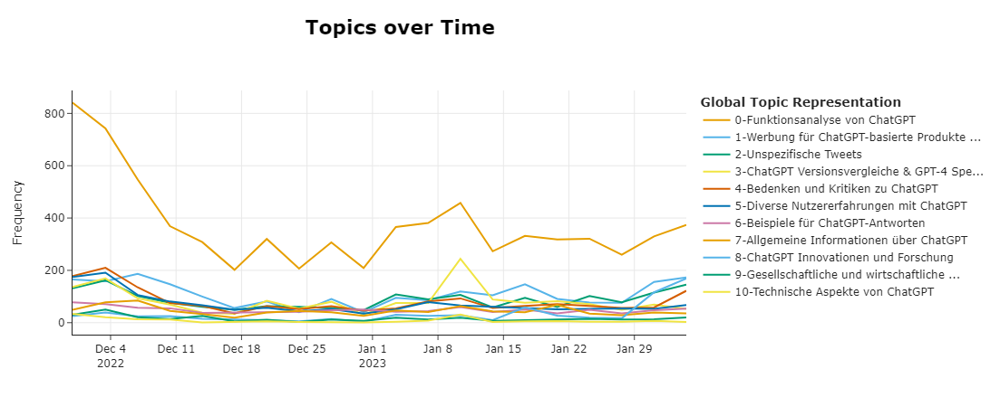

In [49]:
# final Visualization: per category
topic_model.visualize_topics_over_time(topics_over_time)

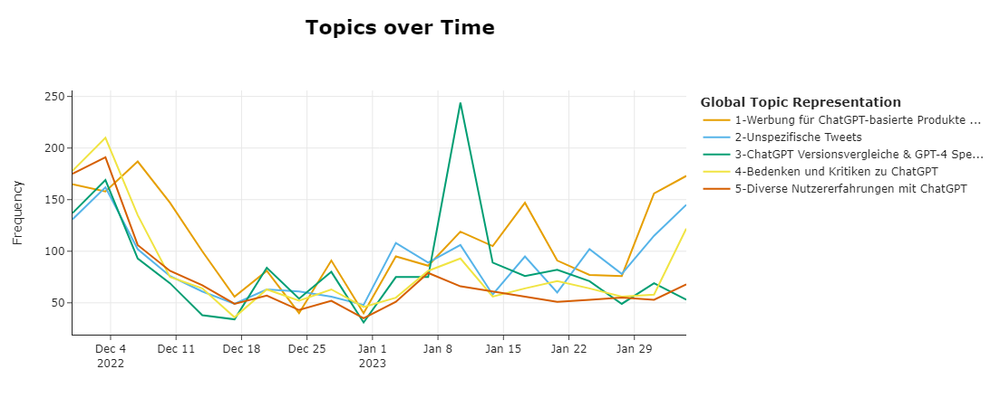

In [50]:
# Visualization middle range
topic_model.visualize_topics_over_time(topics_over_time, topics=[1,2,3,4,5])

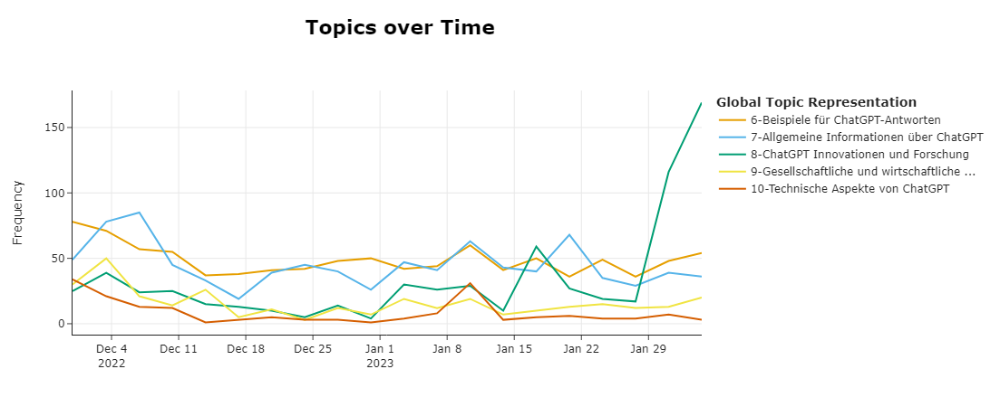

In [51]:
# Visualization botom range
topic_model.visualize_topics_over_time(topics_over_time, topics=[6,7,8,9,10])

In [29]:
print(topic_model.get_representative_docs(0))

["Thank you for your kind words! GPT-3 has the potential to revolutionize many aspects of our lives. It's an exciting time to be involved in this field, and I'm looking forward to seeing how GPT-3 and other language models will continue to evolve and make an impact in the future", 'OpenAI: Now, the downside to our product is that we destroyed it and all the plans for it and sent the engineers to Neptune. All we have is a tech demo it made. It can’t do what you want and will lecture you if you ask. Microsoft: Oh my god. Here is 10 billion dollars', 'well it was based off the previous GPT-3 model, so its been coming for a while now, but i dont know if an ai will replace engineering or developer jobs in the near future. looks like more of a tool people need to learn how to use on top of what they already know']
